# HerdNet Reproduction Notebook

Two-stage training pipeline to reproduce the results reported in *From crowd to herd counting: How to precisely detect and count African mammals using aerial imagery and deep learning?* (Delplanque et al., 2023).

The notebook walks through the exact training recipe (stage 1 + hard-negative patch mining + stage 2) described in the paper, using the `data-delplanque` dataset and the HerdNet reference implementation from `animaloc`.

## Workflow Overview

1. Install all dependencies (PyTorch, `animaloc`, Albumentations, etc.).
2. Configure dataset and output paths.
3. Build training/validation datasets and dataloaders.
4. Stage 1 training (animals-only patches).
5. Mine hard negative patches (HNP) from 24 MP training imagery using LMDS.
6. Stage 2 training (animals + mined negatives).
7. Evaluate on validation/test 24 MP imagery with HerdNet LMDS metrics.

> **Note:** The notebook assumes the dataset from `asg_herdnet/data-delplanque` is available locally (copy it to Colab before running).

In [1]:
# Si trabajas en Colab, asegúrate de usar Python 3
# import sys; assert sys.version_info.major == 3

#!pip install -q torch==2.5.1 torchvision==0.20.1 --index-url https://download.pytorch.org/whl/cu121
#!pip install -q albumentations==1.4.8 albucore>=0.0.12 opencv-python-headless==4.10.0.84 pandas==2.2.3 matplotlib==3.9.2 tqdm==4.66.5 scikit-learn==1.4.2 timm==1.0.12 wandb==0.17.7
#!pip install -q git+https://github.com/Alexandre-Delplanque/HerdNet


In [39]:
import os
import math
import json
import random
import io
import shutil
from pathlib import Path
from typing import Optional, List, Tuple

import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm

import matplotlib.pyplot as plt
from IPython.display import display, Image as IPyImage

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision

import albumentations as A
import wandb

from animaloc.models import HerdNet
from animaloc.models.utils import LossWrapper
from animaloc.train.losses import FocalLoss
from animaloc.train import Trainer
from animaloc.datasets import CSVDataset
from animaloc.data.transforms import MultiTransformsWrapper, FIDT, PointsToMask, DownSample
from animaloc.data.patches import ImageToPatches
from animaloc.eval.metrics import PointsMetrics
from animaloc.eval.stitchers import HerdNetStitcher
from animaloc.eval.evaluators import HerdNetEvaluator
from animaloc.eval.lmds import HerdNetLMDS

# Determinism
SEED = 9292
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DEVICE_NAME = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {DEVICE}")

os.environ.setdefault('MPLCONFIGDIR', str(Path('~/.config/matplotlib').expanduser()))
Path(os.environ['MPLCONFIGDIR']).mkdir(parents=True, exist_ok=True)

NUM_CLASSES = 7  # 6 species + background
DOWN_RATIO = 2
PATCH_SIZE = 512
PATCH_OVERLAP = 160

CLASS_NAMES = {
    1: 'buffalo',
    2: 'elephant',
    3: 'kob',
    4: 'topi',
    5: 'warthog',
    6: 'waterbuck'
}

MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

Using device: cuda


In [3]:
# Dataset + output configuration (edit paths as needed)
DATA_ROOT = Path("/mnt/batch/tasks/shared/LS_root/mounts/clusters/asg-lab/code/Users/amir.sadour/proyecto/data-delplanque")
if not DATA_ROOT.exists():
    raise FileNotFoundError(f"Dataset not found at {DATA_ROOT}. Please adjust DATA_ROOT.")

FULL_TRAIN_CSV = DATA_ROOT / 'train.csv'
FULL_VAL_CSV = DATA_ROOT / 'val.csv'
FULL_TEST_CSV = DATA_ROOT / 'test.csv'

TRAIN_PATCHES_DIR = DATA_ROOT / 'train_patches'
TRAIN_PATCHES_CSV = DATA_ROOT / 'train_patches.csv'
VAL_PATCHES_DIR = DATA_ROOT / 'val_patches'
VAL_PATCHES_CSV = DATA_ROOT / 'val_patches' / 'gt.csv'

FULL_TRAIN_IMAGES_DIR = DATA_ROOT / 'train'
FULL_VAL_IMAGES_DIR = DATA_ROOT / 'val'
FULL_TEST_IMAGES_DIR = DATA_ROOT / 'test'

OUTPUT_ROOT = Path('herdnet_runs')
STAGE1_DIR = OUTPUT_ROOT / 'stage1'
STAGE2_DIR = OUTPUT_ROOT / 'stage2'
HNP_DIR = OUTPUT_ROOT / 'hard_negative_patches'
MPL_DIR = OUTPUT_ROOT / 'mpl_cache'

for path in [OUTPUT_ROOT, STAGE1_DIR, STAGE2_DIR, HNP_DIR, MPL_DIR]:
    path.mkdir(parents=True, exist_ok=True)

os.environ['MPLCONFIGDIR'] = str(MPL_DIR.resolve())

print(f"DATA_ROOT           : {DATA_ROOT.resolve()}")
print(f"Stage 1 workdir     : {STAGE1_DIR.resolve()}")
print(f"Stage 2 workdir     : {STAGE2_DIR.resolve()}")
print(f"HNP directory       : {HNP_DIR.resolve()}")

DATA_ROOT           : /mnt/batch/tasks/shared/LS_root/mounts/clusters/asg-lab/code/Users/amir.sadour/proyecto/data-delplanque
Stage 1 workdir     : /mnt/batch/tasks/shared/LS_root/mounts/clusters/asg-lab/code/Users/amir.sadour/proyecto/herdnet_runs/stage1
Stage 2 workdir     : /mnt/batch/tasks/shared/LS_root/mounts/clusters/asg-lab/code/Users/amir.sadour/proyecto/herdnet_runs/stage2
HNP directory       : /mnt/batch/tasks/shared/LS_root/mounts/clusters/asg-lab/code/Users/amir.sadour/proyecto/herdnet_runs/hard_negative_patches


In [4]:
# Basic dataset sanity checks
train_df = pd.read_csv(TRAIN_PATCHES_CSV)
val_df = pd.read_csv(VAL_PATCHES_CSV)
full_train_df = pd.read_csv(FULL_TRAIN_CSV)
full_val_df = pd.read_csv(FULL_VAL_CSV)
full_test_df = pd.read_csv(FULL_TEST_CSV)

print('--- Patch-level dataset ---')
print('Train patches :', len(train_df['images'].unique()))
print('Val patches   :', len(val_df['images'].unique()))
print('Train label distribution:')
print(train_df['labels'].value_counts().sort_index())

print('--- Full-resolution imagery ---')
print('Train images :', full_train_df['images'].nunique())
print('Val images   :', full_val_df['images'].nunique())
print('Test images  :', full_test_df['images'].nunique())

--- Patch-level dataset ---
Train patches : 7765
Val patches   : 532
Train label distribution:
labels
1    3394
2    2069
3    3452
4     685
5     349
6    4109
Name: count, dtype: int64
--- Full-resolution imagery ---
Train images : 928
Val images   : 111
Test images  : 258


In [5]:
def normalize_tensor(image_tensor: torch.Tensor) -> torch.Tensor:
    '''Normalize a tensor image with ImageNet mean/std.'''
    mean = torch.tensor(MEAN, device=image_tensor.device).view(-1, 1, 1)
    std = torch.tensor(STD, device=image_tensor.device).view(-1, 1, 1)
    return (image_tensor - mean) / std


def build_train_transforms():
    '''Albumentations + end transforms for training (paper recipe).'''
    albu = [
        A.HorizontalFlip(p=0.5),
        A.MotionBlur(blur_limit=15, p=0.5),
        A.Normalize(mean=MEAN, std=STD)
    ]

    end = [
        MultiTransformsWrapper([
            FIDT(num_classes=NUM_CLASSES, down_ratio=DOWN_RATIO, radius=2),
            PointsToMask(num_classes=NUM_CLASSES, radius=2, down_ratio=32)
        ])
    ]
    return albu, end


def build_eval_transforms():
    '''Albumentations + end transforms for validation/testing patches.'''
    albu = [A.Normalize(mean=MEAN, std=STD)]
    end = [DownSample(down_ratio=DOWN_RATIO, anno_type='point')]
    return albu, end


class StageTwoDataset(CSVDataset):
    '''Extends CSVDataset to append mined background patches located in extra directories.'''
    def __init__(self, csv_file: str, root_dir: str, background_dirs=None, albu_transforms=None, end_transforms=None):
        super().__init__(csv_file, root_dir, albu_transforms=albu_transforms, end_transforms=end_transforms)

        self.img_to_dir = {name: Path(root_dir) for name in self._img_names}
        self.background_dirs = []

        if background_dirs:
            for bdir in background_dirs:
                bdir = Path(bdir)
                if not bdir.exists():
                    continue
                self.background_dirs.append(bdir)
                for img_path in bdir.glob('*'):
                    if img_path.suffix.lower() not in {'.jpg', '.jpeg', '.png'}:
                        continue
                    name = img_path.name
                    if name not in self.img_to_dir:
                        self._img_names.append(name)
                    self.img_to_dir[name] = img_path.parent

    def _load_image(self, index: int):
        img_name = self._img_names[index]
        img_dir = self.img_to_dir.get(img_name, Path(self.root_dir))
        return Image.open(img_dir / img_name).convert('RGB')

In [6]:
def create_herdnet(pretrained: bool = True) -> LossWrapper:
    base_model = HerdNet(num_classes=NUM_CLASSES, down_ratio=DOWN_RATIO, pretrained=False)

    if pretrained:
        ckpt_path = Path.home() / '.cache/torch/hub/checkpoints/dla34-ba72cf86.pth'
        if ckpt_path.exists():
            try:
                state_dict = torch.load(ckpt_path, map_location='cpu')
                missing, unexpected = base_model.base_0.load_state_dict(state_dict, strict=False)
                if missing:
                    print(f'Warning: missing keys when loading backbone: {missing}')
                if unexpected:
                    print(f'Warning: unexpected keys when loading backbone: {unexpected}')
            except Exception as e:
                print(f'Warning: could not load pretrained weights ({e}); continuing with random init.')
        else:
            print(f'Pretrained backbone weights not found at {ckpt_path}; continuing with random init.')

    focal_loss = FocalLoss(reduction='mean')
    ce_weights = torch.tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0], dtype=torch.float32, device=DEVICE)
    ce_loss = nn.CrossEntropyLoss(weight=ce_weights, reduction='mean')

    losses = [
        {'loss': focal_loss, 'idx': 0, 'idy': 0, 'lambda': 1.0, 'name': 'focal_loss'},
        {'loss': ce_loss, 'idx': 1, 'idy': 1, 'lambda': 1.0, 'name': 'ce_loss'}
    ]

    model = LossWrapper(base_model, losses=losses)
    model.to(DEVICE)
    return model


def create_optimizer(model, lr: float = 1e-5, weight_decay: float = 5e-3):
    return torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)


AUTO_LR_CONFIG = dict(mode='max', factor=0.1, patience=10, threshold=1e-4, cooldown=10, min_lr=1e-6)


def build_evaluator(model, val_dataset, work_dir) -> HerdNetEvaluator:
    metrics = PointsMetrics(radius=5, num_classes=NUM_CLASSES)
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)
    stitcher = HerdNetStitcher(
        model=model,
        size=(PATCH_SIZE, PATCH_SIZE),
        overlap=PATCH_OVERLAP,
        down_ratio=DOWN_RATIO,
        reduction='mean',
        device_name=DEVICE_NAME
    )
    evaluator = HerdNetEvaluator(
        model=model,
        dataloader=val_loader,
        metrics=metrics,
        stitcher=stitcher,
        work_dir=str(work_dir),
        header='validation',
        lmds_kwargs={'kernel_size': (3, 3), 'adapt_ts': 0.3, 'neg_ts': 0.1},
        device_name=DEVICE_NAME
    )
    return evaluator


def run_training_stage(stage_name: str, model: LossWrapper, train_dataset, val_dataset, work_dir: Path,
                       batch_size: int = 32, num_epochs: int = 100,
                       use_wandb: bool = False) -> tuple[Path, "wandb.sdk.wandb_run.Run | None"]:
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
    evaluator = build_evaluator(model, val_dataset, work_dir)
    optimizer = create_optimizer(model)

    run = None
    if use_wandb:
        config = {
            'stage': stage_name,
            'batch_size': batch_size,
            'num_epochs': num_epochs,
            'optimizer': 'adam',
            'learning_rate': optimizer.param_groups[0]['lr'],
            'weight_decay': optimizer.param_groups[0]['weight_decay'],
            'train_samples': len(train_dataset),
            'val_samples': len(val_dataset),
            'down_ratio': DOWN_RATIO,
            'patch_size': PATCH_SIZE,
            'patch_overlap': PATCH_OVERLAP,
        }
        run = wandb.init(
            project=WANDB_PROJECT,
            entity=WANDB_ENTITY,
            group=WANDB_GROUP,
            tags=WANDB_TAGS,
            name=stage_name,
            config=config,
            reinit=True
        )

    trainer = Trainer(
        model=model,
        train_dataloader=train_loader,
        optimizer=optimizer,
        num_epochs=num_epochs,
        evaluator=evaluator,
        work_dir=str(work_dir),
        device_name=DEVICE_NAME,
        auto_lr=AUTO_LR_CONFIG,
        print_freq=50,
        valid_freq=1
    )

    trainer.start(warmup_iters=100, checkpoints='best', select='max', validate_on='f1_score', wandb_flag=use_wandb)

    if run is not None:
        run.summary['best_validation'] = trainer.best_val

    return work_dir / 'best_model.pth', run


def load_checkpoint(model: LossWrapper, checkpoint_path: Path):
    ckpt = torch.load(checkpoint_path, map_location=DEVICE)
    model.load_state_dict(ckpt['model_state_dict'])
    return model


In [7]:
def log_metrics_to_wandb(run, summary: dict, per_class: list, prefix: str):
    if run is None:
        return

    run.log({f'{prefix}/{k}': v for k, v in summary.items()}, commit=False)

    table = wandb.Table(columns=['class', 'precision', 'recall', 'f1', 'mae', 'rmse'])
    for row in per_class:
        table.add_data(row['class'], row['precision'], row['recall'], row['f1'], row['mae'], row['rmse'])
        run.log({
            f"{prefix}/{row['class']}/precision": row['precision'],
            f"{prefix}/{row['class']}/recall": row['recall'],
            f"{prefix}/{row['class']}/f1": row['f1'],
        }, commit=False)
    run.log({f'{prefix}/per_class_table': table})


In [8]:
train_albu, train_end = build_train_transforms()
val_albu, val_end = build_eval_transforms()

stage1_train_dataset = CSVDataset(
    csv_file=str(TRAIN_PATCHES_CSV),
    root_dir=str(TRAIN_PATCHES_DIR),
    albu_transforms=train_albu,
    end_transforms=train_end
)

val_patch_dataset = CSVDataset(
    csv_file=str(VAL_PATCHES_CSV),
    root_dir=str(VAL_PATCHES_DIR),
    albu_transforms=val_albu,
    end_transforms=val_end
)

print(f"Stage 1 train samples : {len(stage1_train_dataset)}")
print(f"Validation patches    : {len(val_patch_dataset)}")

Stage 1 train samples : 7765
Validation patches    : 532


## Training Configuration (per Delplanque et al., 2023)

- Stage 1 trains on animal-only 512×512 patches for 100 epochs with Adam (weight decay 0.005) after ImageNet pretraining.
- Linear warmup over the first 100 iterations, then ReduceLROnPlateau (factor 0.1, patience 10) down to 1e-6 when validation stalls.
- Augmentations follow the paper: random horizontal flip and motion blur (Albumentations).
- Stage 2 repeats training after mining hard negative patches from 24 MP imagery using LMDS, mirroring the paper's HNP refinement.

In [9]:
USE_WANDB = True  # set to False to disable experiment logging
WANDB_PROJECT = "herdnet-reproduction"
WANDB_ENTITY = None  # e.g., 'my-team'; leave None for default
WANDB_GROUP = "two-stage"
WANDB_TAGS = ['herdnet', 'two-stage', 'paper-reproduction']

In [10]:
# Pre-download DLA-34 ImageNet weights from timm if needed
attempt_timm_download = True
if attempt_timm_download:
    try:
        import torch
        import timm
        ckpt_dir = Path.home() / '.cache/torch/hub/checkpoints'
        ckpt_dir.mkdir(parents=True, exist_ok=True)
        ckpt_path = ckpt_dir / 'dla34-ba72cf86.pth'
        if not ckpt_path.exists():
            print('Downloading DLA-34 backbone weights via timm...')
            timm_model = timm.create_model('hf_hub:timm/dla34.in1k', pretrained=True)
            torch.save(timm_model.state_dict(), ckpt_path)
            print(f'Weights saved to {ckpt_path}')
    except Exception as e:
        print(f'Warning: failed to fetch DLA-34 weights with timm ({e}). Proceeding without cached weights.')


In [16]:
RUN_STAGE1 = True  # set to False to reuse an existing checkpoint

stage1_model = create_herdnet(pretrained=True)

if RUN_STAGE1:
    best_stage1_ckpt, stage1_run = run_training_stage(
        stage_name='stage1',
        model=stage1_model,
        train_dataset=stage1_train_dataset,
        val_dataset=val_patch_dataset,
        work_dir=STAGE1_DIR,
        use_wandb=USE_WANDB
    )
else:
    best_stage1_ckpt = STAGE1_DIR / 'best_model.pth'
    if not best_stage1_ckpt.exists():
        raise FileNotFoundError(f"Checkpoint not found: {best_stage1_ckpt}")
    load_checkpoint(stage1_model, best_stage1_ckpt)
    stage1_run = None

if stage1_run is not None:
    stage1_run.finish()

print(f"Stage 1 checkpoint: {best_stage1_ckpt}")


Stage 1 checkpoint: herdnet_runs/stage1/best_model.pth


In [12]:
def mine_hard_negatives(model: LossWrapper, image_dir: Path, annotations_csv: Path, output_dir: Path,
                          max_patches: Optional[int] = None) -> list:
    output_dir.mkdir(parents=True, exist_ok=True)
    annotations = pd.read_csv(annotations_csv)
    annotations_by_image = annotations.groupby('images')

    base_model = model.model if isinstance(model, LossWrapper) else model
    base_model.eval()

    lmds = HerdNetLMDS(up=True, adapt_ts=0.3, neg_ts=0.1)

    saved_files = []
    to_pil = torchvision.transforms.ToPILImage()

    image_paths = sorted(image_dir.glob('*.JPG'))
    if not image_paths:
        image_paths = sorted(image_dir.glob('*.jpg'))

    for img_path in tqdm(image_paths, desc='Mining HNP'):
        image = Image.open(img_path).convert('RGB')
        base_tensor = torchvision.transforms.ToTensor()(image)
        patches = ImageToPatches(base_tensor, size=(PATCH_SIZE, PATCH_SIZE), overlap=PATCH_OVERLAP)
        patch_tensors = patches.make_patches()
        limits = patches.get_limits()

        img_annotations = annotations_by_image.get_group(img_path.name) if img_path.name in annotations_by_image.groups else pd.DataFrame(columns=['x', 'y', 'labels'])

        for idx, patch_tensor in enumerate(patch_tensors):
            limit = limits[idx]
            inside = img_annotations[
                (img_annotations['x'] >= limit.x_min) & (img_annotations['x'] < limit.x_max) &
                (img_annotations['y'] >= limit.y_min) & (img_annotations['y'] < limit.y_max)
            ]

            if not inside.empty:
                continue

            patch_norm = normalize_tensor(patch_tensor.clone()).unsqueeze(0).to(DEVICE)

            with torch.no_grad():
                heatmap, clsmap = base_model(patch_norm)

            counts, locs, labels, scores, _ = lmds([heatmap.cpu(), clsmap.cpu()])
            if len(locs[0]) == 0:
                continue

            filename = f"{img_path.stem}_hnp_{idx:05d}.JPG"
            save_path = output_dir / filename
            to_pil(patch_tensor).save(save_path)
            saved_files.append(filename)

            if max_patches is not None and len(saved_files) >= max_patches:
                return saved_files

    return saved_files

In [13]:
RUN_MINING = True
MAX_HNP = None  # set an integer to limit the number of mined negatives

if RUN_MINING:
    stage1_model.eval()
    mined = mine_hard_negatives(
        model=stage1_model,
        image_dir=FULL_TRAIN_IMAGES_DIR,
        annotations_csv=FULL_TRAIN_CSV,
        output_dir=HNP_DIR,
        max_patches=MAX_HNP
    )
    print(f"Mined hard negatives: {len(mined)}")
else:
    mined = [p.name for p in HNP_DIR.glob('*.JPG')]
    print(f"Using existing hard negatives: {len(mined)}")

Mining HNP: 100%|██████████| 928/928 [1:23:05<00:00,  5.37s/it]

Mined hard negatives: 16412


In [14]:
stage2_train_dataset = StageTwoDataset(
    csv_file=str(TRAIN_PATCHES_CSV),
    root_dir=str(TRAIN_PATCHES_DIR),
    background_dirs=[HNP_DIR],
    albu_transforms=train_albu,
    end_transforms=train_end
)

print(f"Stage 2 train samples : {len(stage2_train_dataset)} (includes mined negatives)")

Stage 2 train samples : 24177 (includes mined negatives)


In [21]:
RUN_STAGE2 = True

stage2_model = create_herdnet(pretrained=True)
load_checkpoint(stage2_model, best_stage1_ckpt)

if RUN_STAGE2:
    best_stage2_ckpt, stage2_run = run_training_stage(
        stage_name='stage2',
        model=stage2_model,
        train_dataset=stage2_train_dataset,
        val_dataset=val_patch_dataset,
        work_dir=STAGE2_DIR,
        use_wandb=USE_WANDB
    )
else:
    best_stage2_ckpt = STAGE2_DIR / 'best_model.pth'
    if not best_stage2_ckpt.exists():
        raise FileNotFoundError(f"Checkpoint not found: {best_stage2_ckpt}")
    load_checkpoint(stage2_model, best_stage2_ckpt)
    stage2_run = None

if stage2_run is not None:
    stage2_run.log({'hnp/mined_patches': len(mined)})

print(f"Stage 2 checkpoint: {best_stage2_ckpt}")


Stage 2 checkpoint: herdnet_runs/stage2/best_model.pth


In [ ]:
if USE_WANDB and stage2_run is not None:
    stage2_run.finish()

In [28]:

def evaluate_full_images(model: LossWrapper, image_dir: Path, annotations_csv: Path, split_name: str):
    annotations = pd.read_csv(annotations_csv)
    annotations_by_image = annotations.groupby('images')

    metrics = PointsMetrics(radius=5, num_classes=NUM_CLASSES)
    lmds = HerdNetLMDS(up=False, adapt_ts=0.3, neg_ts=0.1)

    pred_counts = {cls_id: 0 for cls_id in range(1, NUM_CLASSES)}
    gt_counts = {cls_id: 0 for cls_id in range(1, NUM_CLASSES)}

    def _to_float(val):
        if isinstance(val, list):
            return float(val[0]) if val else float('nan')
        if hasattr(val, 'item'):
            try:
                return float(val.item())
            except Exception:
                pass
        return float(val)

    stitcher = HerdNetStitcher(
        model=model,
        size=(PATCH_SIZE, PATCH_SIZE),
        overlap=PATCH_OVERLAP,
        down_ratio=DOWN_RATIO,
        reduction='mean',
        device_name=DEVICE_NAME
    )

    image_paths = sorted(image_dir.glob('*.JPG'))
    if not image_paths:
        image_paths = sorted(image_dir.glob('*.jpg'))

    for img_path in tqdm(image_paths, desc=f'Evaluating {split_name}'):
        image = Image.open(img_path).convert('RGB')
        tensor = torchvision.transforms.ToTensor()(image)
        tensor = normalize_tensor(tensor).to(DEVICE)

        with torch.no_grad():
            stitched = stitcher(tensor)

        heatmap = stitched[:, :1, :, :].cpu()
        clsmap = stitched[:, 1:, :, :].cpu()

        counts, locs, labels, scores, _ = lmds([heatmap, clsmap])

        pred_points = []
        pred_labels = []
        pred_scores = []
        if locs[0]:
            pred_points = [
                (float(y * DOWN_RATIO + DOWN_RATIO / 2), float(x * DOWN_RATIO + DOWN_RATIO / 2))
                for y, x in locs[0]
            ]
            pred_labels = [int(lbl) for lbl in labels[0]]
            pred_scores = [float(score) for score in scores[0]]
            for lbl in pred_labels:
                if lbl in pred_counts:
                    pred_counts[lbl] += 1

        preds = dict(
            loc=pred_points,
            labels=pred_labels,
            scores=pred_scores
        )

        if img_path.name in annotations_by_image.groups:
            img_gt = annotations_by_image.get_group(img_path.name)
            gt_points = list(zip(img_gt['y'].tolist(), img_gt['x'].tolist()))
            gt_labels = [int(lbl) for lbl in img_gt['labels'].tolist()]
            for lbl in gt_labels:
                if lbl in gt_counts:
                    gt_counts[lbl] += 1
        else:
            gt_points, gt_labels = [], []

        gt = dict(
            loc=gt_points,
            labels=gt_labels
        )

        metrics.feed(gt=gt, preds=preds, est_count=counts[0])

    per_class = []
    for cls_id in range(1, NUM_CLASSES):
        per_class.append({
            'class': CLASS_NAMES.get(cls_id, str(cls_id)),
            'precision': _to_float(metrics.precision(cls_id)),
            'recall': _to_float(metrics.recall(cls_id)),
            'f1': _to_float(metrics.fbeta_score(c=cls_id)),
            'mae': _to_float(metrics.mae(cls_id)),
            'rmse': _to_float(metrics.rmse(cls_id)),
            'gt_count': gt_counts.get(cls_id, 0),
            'pred_count': pred_counts.get(cls_id, 0)
        })

    metrics.aggregate()

    def _counts_to_named(counts_dict):
        return {
            CLASS_NAMES.get(cls_id, str(cls_id)): int(counts_dict.get(cls_id, 0))
            for cls_id in range(1, NUM_CLASSES)
        }

    summary = {
        'precision': metrics.precision(),
        'recall': metrics.recall(),
        'f1': metrics.fbeta_score(),
        'mae': metrics.mae(),
        'rmse': metrics.rmse(),
        'gt_counts': _counts_to_named(gt_counts),
        'pred_counts': _counts_to_named(pred_counts)
    }

    return summary, per_class, metrics.confusion_matrix


In [19]:
def print_eval(summary, per_class, confusion):
    print('Global metrics:')
    print(json.dumps(summary, indent=2))
    print('Per-class metrics:')
    display(pd.DataFrame(per_class))
    print('Confusion matrix (rows=gt, cols=pred, background excluded):')
    idx = [CLASS_NAMES[i] for i in range(1, NUM_CLASSES)]
    display(pd.DataFrame(confusion, index=idx, columns=idx))

## Validation Set Evaluation

Run HerdNet on the validation 24 MP imagery and report the paper metrics (precision, recall, F1, MAE, RMSE) along with per-species statistics.

In [29]:
summary_val, per_class_val, confusion_val = evaluate_full_images(stage2_model, FULL_VAL_IMAGES_DIR, FULL_VAL_CSV, 'val')
print_eval(summary_val, per_class_val, confusion_val)
log_metrics_to_wandb(stage2_run if USE_WANDB else None, summary_val, per_class_val, 'val')

Evaluating val: 100%|██████████| 111/111 [04:10<00:00,  2.25s/it]

Global metrics:
{
  "precision": 0.5128888888888888,
  "recall": 0.5899795501022495,
  "f1": 0.5487398953875416,
  "mae": 2.2972972972972974,
  "rmse": 4.157918744791472,
  "gt_counts": {
    "buffalo": 369,
    "elephant": 102,
    "kob": 161,
    "topi": 43,
    "warthog": 39,
    "waterbuck": 264
  },
  "pred_counts": {
    "buffalo": 398,
    "elephant": 139,
    "kob": 166,
    "topi": 51,
    "warthog": 33,
    "waterbuck": 338
  }
}
Per-class metrics:


,class,precision,recall,f1,mae,rmse,gt_count,pred_count
0,buffalo,0.540201,0.582656,0.560626,1.687500,2.520747,369,398
1,elephant,0.266187,0.362745,0.307054,1.500000,1.816590,102,139
2,kob,0.620482,0.639752,0.629969,1.418605,2.236068,161,166
3,topi,0.215686,0.255814,0.234043,1.517241,1.982684,43,51
4,warthog,0.424242,0.358974,0.388889,2.235294,2.722456,39,33
5,waterbuck,0.393491,0.503788,0.441860,3.377778,5.788878,264,338


Confusion matrix (rows=gt, cols=pred, background excluded):


,buffalo,elephant,kob,topi,warthog,waterbuck
buffalo,215.0,2.0,14.0,4.0,1.0,0.0
elephant,1.0,37.0,2.0,2.0,2.0,0.0
kob,17.0,0.0,103.0,0.0,1.0,0.0
topi,0.0,1.0,0.0,11.0,0.0,1.0
warthog,14.0,0.0,1.0,1.0,14.0,0.0
waterbuck,0.0,0.0,0.0,0.0,0.0,133.0


## Test Set Evaluation

Compute the same HerdNet metrics on the held-out test imagery to compare against the paper's reported results.

In [32]:
summary_test, per_class_test, confusion_test = evaluate_full_images(stage2_model, FULL_TEST_IMAGES_DIR, FULL_TEST_CSV, 'test')
print_eval(summary_test, per_class_test, confusion_test)
log_metrics_to_wandb(stage2_run if USE_WANDB else None, summary_test, per_class_test, 'test')


Evaluating test: 100%|██████████| 258/258 [09:27<00:00,  2.20s/it]

Global metrics:
{
  "precision": 0.500570559147965,
  "recall": 0.5724227925184863,
  "f1": 0.5340909090909091,
  "mae": 2.798449612403101,
  "rmse": 7.809753393162649,
  "gt_counts": {
    "buffalo": 675,
    "elephant": 349,
    "kob": 477,
    "topi": 74,
    "warthog": 36,
    "waterbuck": 688
  },
  "pred_counts": {
    "buffalo": 693,
    "elephant": 298,
    "kob": 411,
    "topi": 141,
    "warthog": 45,
    "waterbuck": 1041
  }
}
Per-class metrics:


,class,precision,recall,f1,mae,rmse,gt_count,pred_count
0,buffalo,0.558442,0.573333,0.565789,2.600000,4.932883,675,693
1,elephant,0.389262,0.332378,0.358578,2.477273,4.864061,349,298
2,kob,0.705596,0.607966,0.653153,1.394495,2.732744,477,411
3,topi,0.134752,0.256757,0.176744,2.095890,3.450233,74,141
4,warthog,0.311111,0.388889,0.345679,2.062500,2.610077,36,45
5,waterbuck,0.320845,0.485465,0.386350,4.980198,11.891839,688,1041


Confusion matrix (rows=gt, cols=pred, background excluded):


,buffalo,elephant,kob,topi,warthog,waterbuck
buffalo,387.0,2.0,14.0,10.0,8.0,0.0
elephant,5.0,116.0,0.0,27.0,0.0,1.0
kob,77.0,2.0,290.0,4.0,0.0,0.0
topi,0.0,0.0,0.0,19.0,0.0,0.0
warthog,4.0,1.0,0.0,1.0,14.0,0.0
waterbuck,0.0,0.0,0.0,0.0,0.0,334.0


## Test Predictions Visualizations

Sample overlays of HerdNet predictions (red) and ground-truth animals (green) on held-out test images.

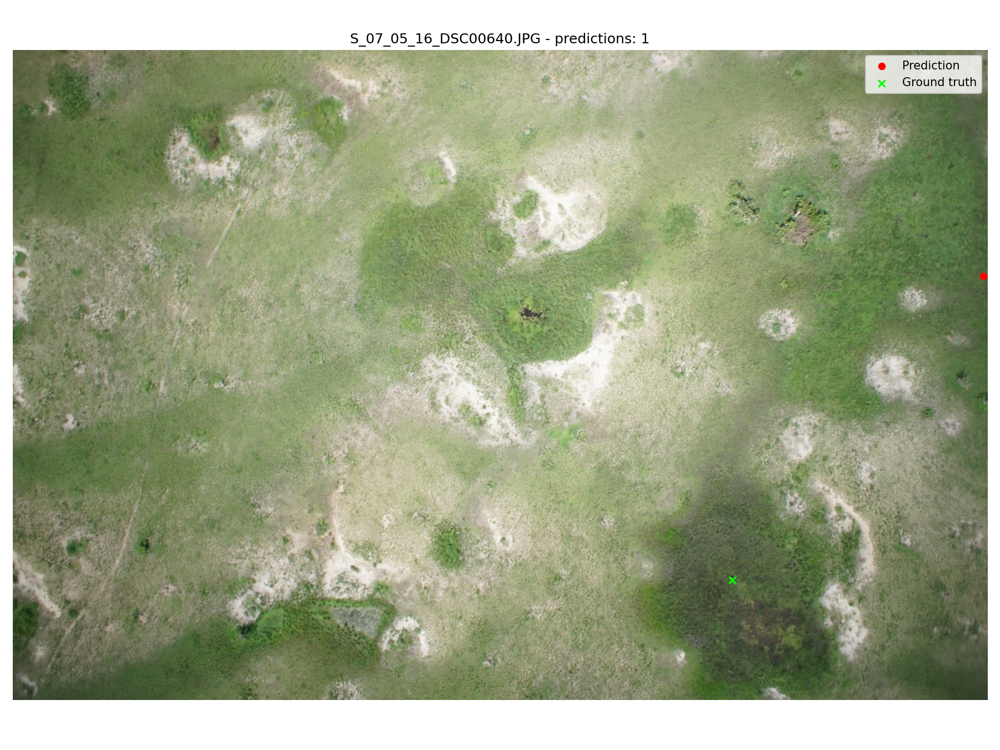

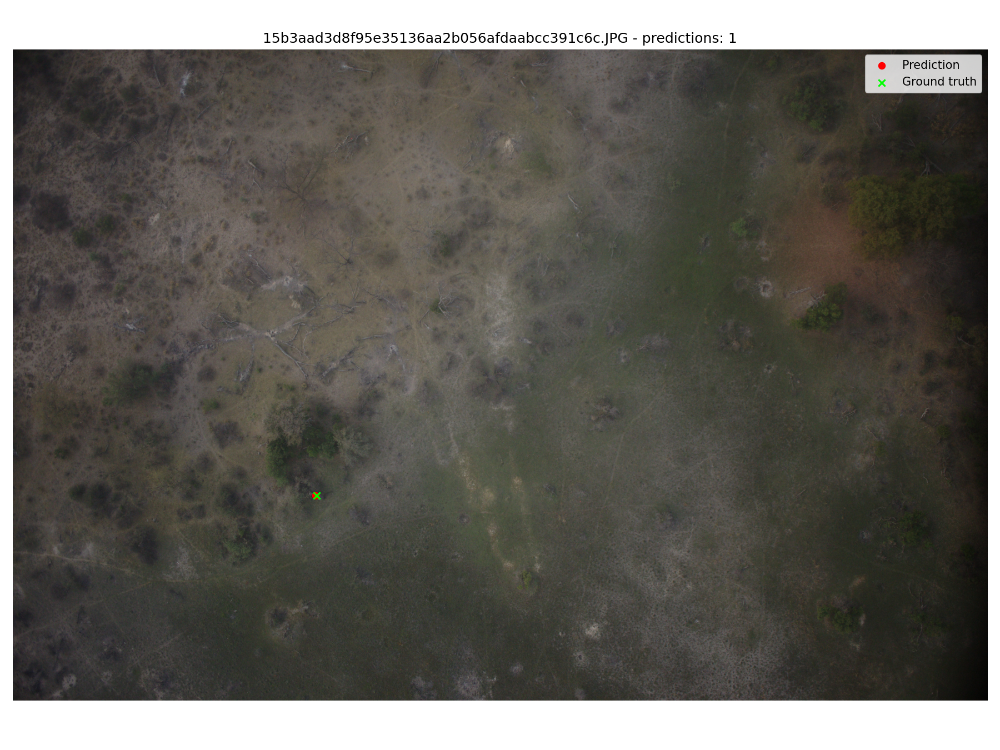

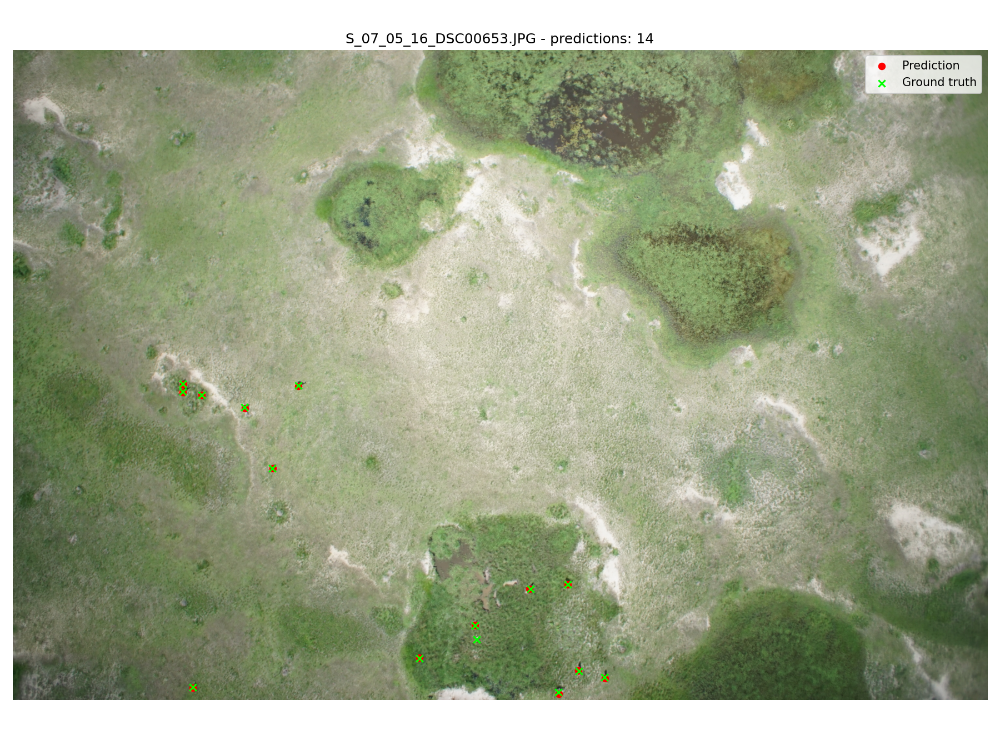

In [41]:

def visualize_test_predictions(model: LossWrapper, image_dir: Path, annotations_csv: Path, sample_images: Optional[List[str]] = None, num_samples: int = 3, log_to_wandb: bool = False, run=None):
    annotations = pd.read_csv(annotations_csv)
    annotations_by_image = annotations.groupby('images')

    image_paths = sorted(image_dir.glob('*.JPG'))
    if not image_paths:
        image_paths = sorted(image_dir.glob('*.jpg'))
    if not image_paths:
        raise RuntimeError('No images found in test directory.')

    if sample_images is not None:
        selected = []
        for name in sample_images:
            candidate = image_dir / name
            if not candidate.exists():
                raise FileNotFoundError(f'{name} not found in {image_dir}')
            selected.append(candidate)
    else:
        rng = np.random.default_rng(SEED)
        num = min(num_samples, len(image_paths))
        selected = list(rng.choice(image_paths, size=num, replace=False))

    stitcher = HerdNetStitcher(
        model=model,
        size=(PATCH_SIZE, PATCH_SIZE),
        overlap=PATCH_OVERLAP,
        down_ratio=DOWN_RATIO,
        reduction='mean',
        device_name=DEVICE_NAME
    )
    lmds = HerdNetLMDS(up=False, adapt_ts=0.3, neg_ts=0.1)

    for img_path in selected:
        image = Image.open(img_path).convert('RGB')
        tensor = torchvision.transforms.ToTensor()(image)
        tensor = normalize_tensor(tensor).to(DEVICE)

        with torch.no_grad():
            stitched = stitcher(tensor)

        heatmap = stitched[:, :1, :, :].cpu()
        clsmap = stitched[:, 1:, :, :].cpu()
        counts, locs, labels, scores, _ = lmds([heatmap, clsmap])

        pred_points = []
        if locs[0]:
            pred_points = [
                (float(y * DOWN_RATIO + DOWN_RATIO / 2), float(x * DOWN_RATIO + DOWN_RATIO / 2))
                for y, x in locs[0]
            ]

        fig, ax = plt.subplots(figsize=(12, 9))
        ax.imshow(image)
        if pred_points:
            xs = [pt[1] for pt in pred_points]
            ys = [pt[0] for pt in pred_points]
            ax.scatter(xs, ys, c='red', s=30, label='Prediction')
        if img_path.name in annotations_by_image.groups:
            gt = annotations_by_image.get_group(img_path.name)
            ax.scatter(gt['x'], gt['y'], c='lime', s=35, marker='x', label='Ground truth')
        ax.set_title(f"{img_path.name} - predictions: {len(pred_points)}")
        ax.axis('off')
        ax.legend(loc='upper right')
        fig.tight_layout()

        buf = io.BytesIO()
        fig.savefig(buf, format='png', dpi=150)
        buf.seek(0)
        display(IPyImage(data=buf.getvalue()))

        if log_to_wandb and run is not None:
            run.log({f'test_samples/{img_path.name}': wandb.Image(fig)})
        plt.close(fig)

# Visualize three random test images (set sample_images to a list of filenames to view specific ones)
visualize_test_predictions(stage2_model, FULL_TEST_IMAGES_DIR, FULL_TEST_CSV, num_samples=3, log_to_wandb=USE_WANDB, run=stage2_run)